# Basic Image Processing with Python

> In this blog post, we will walk you through the basic Image Processing with OpenCV.

- toc: true
- badges: false
- comments: true
- image: images/mario_.jpg
- categories: [image_processing, overview]
- sticky_rank : 1

# Image Acquisition

Images, taken from real life with camera, and then stored as the digital format in computer.<br>
In digital format, the images are represented by three color channel. (Red, Green and Blue).
![mario](imgs/mario.gif)

In Python, we can read in the image with matplotlib library in following way :

```python
img = matplotlib.image.imread(img_name)
```
After reading the image with above method, the variable `img` will contain the image value as the array in `ndarray` data type.<br>
We can also inspect the dimension(channel) of image in code with:
```python
h, w, d = img.shape
```
```
16, 16, 3
```
As the above fig show, the mario image have 16 by 16 pixel values. So, *h* and *w* will be 16 x 16 and color image have 3 dimension. 

# Arithemetic Operations

Since Images are actually numbers, we could use **functions** to operate on the images.<br>
The most basic function would be *adding, subtracting, multiplication and division.*<br>
We will introduce *Adding* and *Subtracting* here in this blog post.

In [56]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2

In [57]:
#collapse-hide
# Helper Function for showing Images
def imShow(imgs, titles=None):
    num = len(imgs)
    x = (num//4)+1
    y = int(np.ceil(num/x))
    plt.figure(figsize=(18,15))
    for i in range(num):
        plt.subplot(x, y, i+1)
        cmap=None
        title=None
        if imgs[i].ndim==2:cmap='gray'
        if titles!=None:title=titles[i]
        plt.imshow(imgs[i], cmap=cmap)
        plt.title(title,fontdict={'fontsize':23})
    plt.tight_layout()
    plt.show()

## Subtract Two Images

In the below Image, the subtracted result shows the difference between two images.

> Note: While subtracting, we need to be careful of the **data type range**.

Image arrays are typically in the range of `0 ~ 255`. The data type is `np.uint8`. If it is negative value, it will subtract that negative value with 256.

Below show the example:

In [58]:
#collapse-hide
'''Because 'b' is in the range of 0 ~ 255, while it exceed that value, it will subtract from 256.
eg. here, 'b' should be -5, so, it would be '256-5 = 251'
'''
a = np.array([5])
b = (a-10).astype(np.uint8)
print(b)

[251]


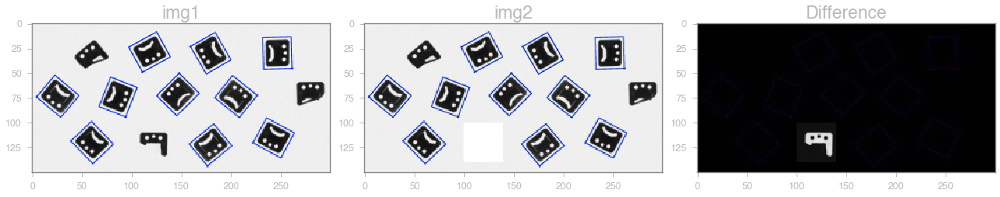

In [59]:
#collapse-hide
img1 = mpimg.imread('1.jpg')
img2 = mpimg.imread('2.jpg')

# First let's check their dimension
assert img1.shape == img2.shape

# Extend range so there won't be gibberish
# diff = img2 - img1
diff = img2.astype(np.int16) - img1.astype(np.int16)
diff[diff<0] = 0
imShow([img1, img2, diff], ['img1', 'img2', 'Difference'])

## Add Two Images

We can also add two images if they are in the same Dimension.

Before resize :  (478, 717, 3) (421, 748, 3)
After resize :  (421, 748, 3) (421, 748, 3)


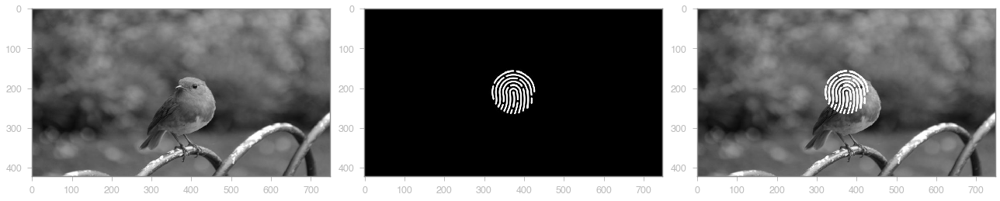

In [60]:
#collapse-hide
img1 = mpimg.imread('bird.jpg')
img2 = mpimg.imread('back.jpg')
h, w, d = img2.shape

print(f'Before resize : ', img1.shape, img2.shape)
img1 = cv2.resize(img1, (w, h))
print(f'After resize : ', img1.shape, img2.shape)

add = img2.astype(np.int16) + img1.astype(np.int16)
add[add>255] = 255
imShow([img1, img2, add])

> Important: Both Adding and Subtracting two images need to have both same dimension for both inputs.

# [Geometric Transformations](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_geometric_transformations/py_geometric_transformations.html)


## Rotation, Crop

- Rotation in the image is achieved by applying the transformation matrix to the image.

```python
M =  cv2.getRotationMatrix2D((center_x, center_y), angle_to_rotate, scale)
rotated = cv2.warpAffine(img, M, (x, y))
```

- Cropping is just simply *Slicing* of the image(numpy array).

```python
cropped = img[x_coor:x_coor, y_coor:y_coor]
```

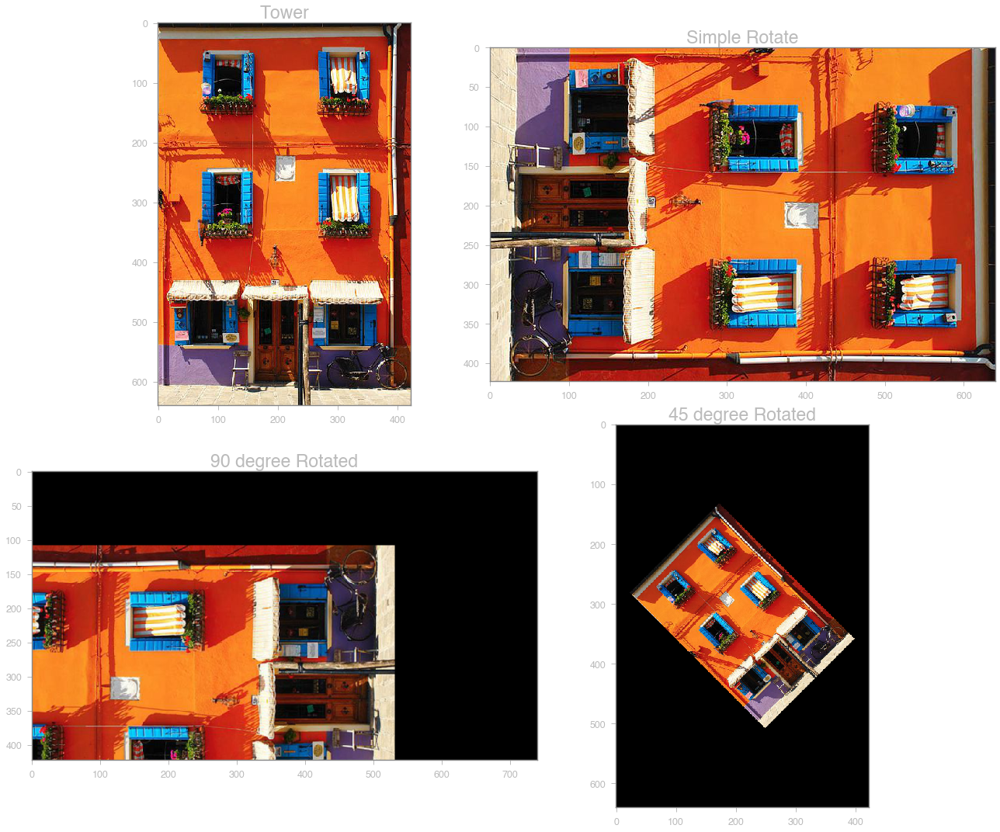

In [61]:
#collapse-hide
# Rotation
img = mpimg.imread('tower.jpg')
h, w, d = img.shape

simple = cv2.rotate(img, cv2.cv2.ROTATE_90_CLOCKWISE)

# More Flexible This Way
M = cv2.getRotationMatrix2D((w/2, h/2), 90, 1)
rotated = cv2.warpAffine(img, M, (h+100, w))

M = cv2.getRotationMatrix2D((w//2, h//2), 45, 0.5)
rotated_ = cv2.warpAffine(img, M, (w, h))

imShow([img, simple, rotated, rotated_], ['Tower', 'Simple Rotate', '90 degree Rotated', '45 degree Rotated'])

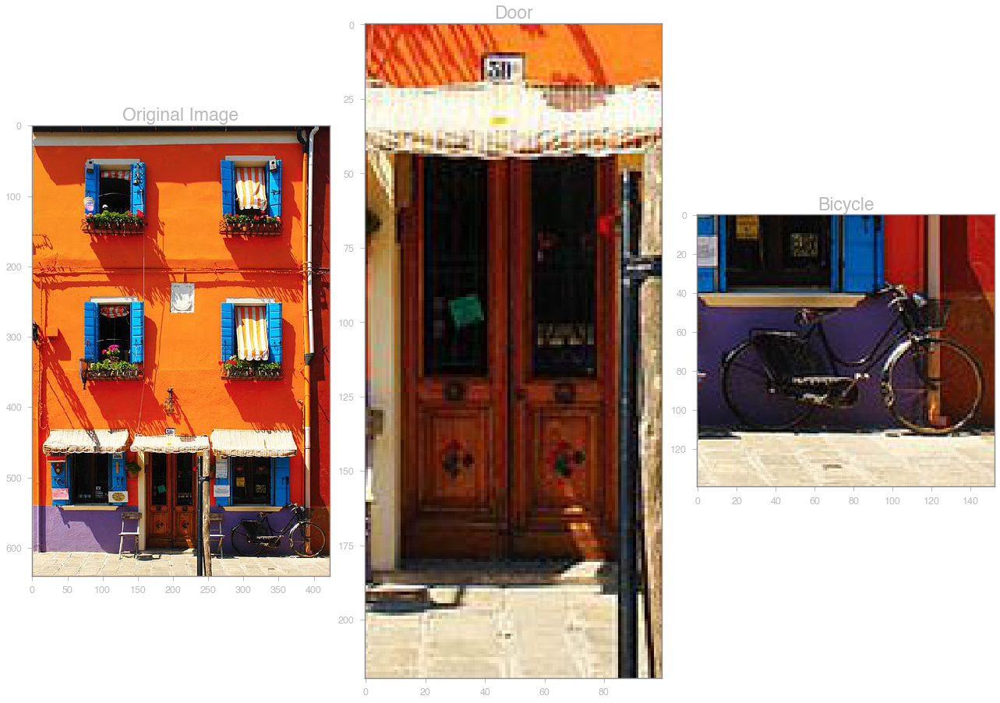

In [62]:
#collapse-hide
# Crop [Image Slicing]
img_copy = np.copy(img)
door = img_copy[420:, 150:250, :]
bicycle = img_copy[500:, 270:, :]
imShow([img,  door, bicycle], ['Original Image', 'Door', 'Bicycle'])

# Color Image Transformation

## RGB -> BGR -> HSV

Image can be converted to various color space by
`cv2.cvtColor(src, cv2.COLOR_)`.

Typically, if the image is read with `matplotlib.image.imread(file_name)`, then it would read in with **RGB** format. And `matplotlib.pyplot.imshow(img_array)` would read the array as **RGB** format and display it.

While ```cv2.imread(file_name)``` would read in with **BGR** format and `cv2.imshow()` display as it take the array in  **BGR** format.

> Warning: read with matplotlib and plot with cv2 will result in Color space shift.

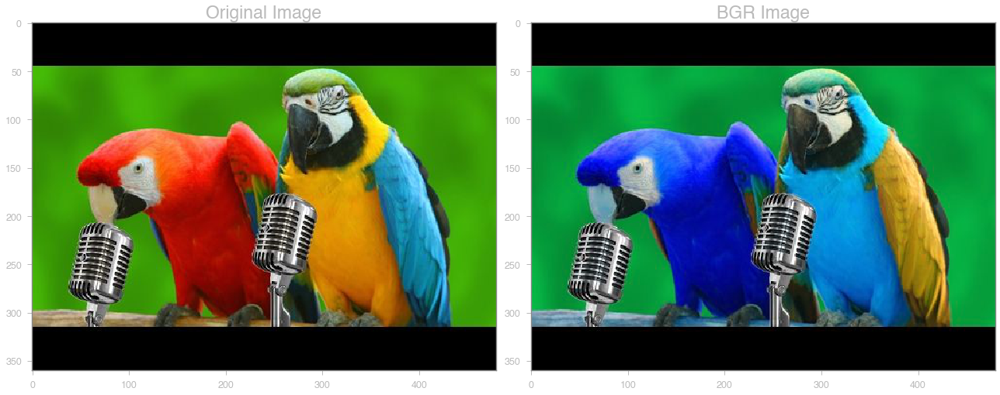

In [64]:
#collapse-hide
img = mpimg.imread('parrot.jpg')
bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
imShow([img, bgr], ['Original Image', 'BGR Image'])

Unlike other color space, in *HSV*, the range for hue is from *0 ~ 179*.

>Hue value actually represent what we human understand of color.

eg. For red color, hue value would always be 0, regardless of the change in brightness and saturation.

hue		 0 179 
saturation	 0 255 
value		 0 255


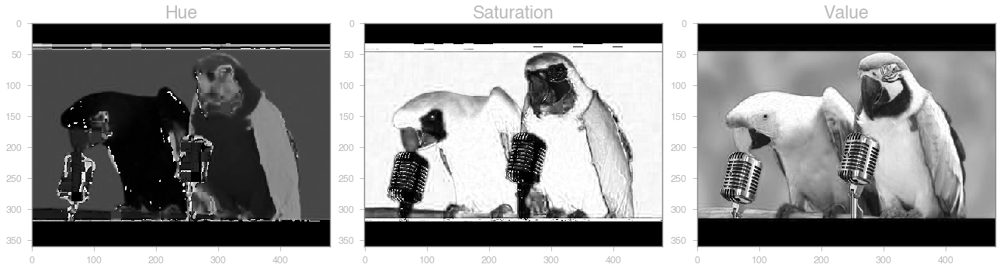

In [65]:
#collapse-hide
img = mpimg.imread('parrot.jpg')
hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
h = hsv[:, :, 0];s = hsv[:, :, 1];v = hsv[:, :, 2]
print('hue\t\t', np.min(h), np.max(h),
      '\nsaturation\t', np.min(s), np.max(s),
      '\nvalue\t\t', np.min(v), np.max(v))
imShow([h, s, v], ['Hue', 'Saturation', 'Value'])

# Resizing Image


- For the resizing, there are two cases:
    - Downsampling (Resized Image have lesser resolution than original One)
    - Upsampling (Resized Image have more resolution than original One)

  Also, there are many [Interpolation methods](https://www.tutorialkart.com/opencv/python/opencv-python-resize-image/) to achieve resizing:
    - INTER_NEAREST (nearest-neighbour interpolation)
    - INTER_LINEAR (bilinear interpolation)
    - INTER_AREA (pixel area relation interpolation) [preferred for downsampling]
    - INTER_CUBIC (bicubic interpolation)
    - INTER_LANCZOS4 (lanczos interpolation)
    
```python
resized = cv2.resize(img, resized_dimension, interpolations=methods)
```

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


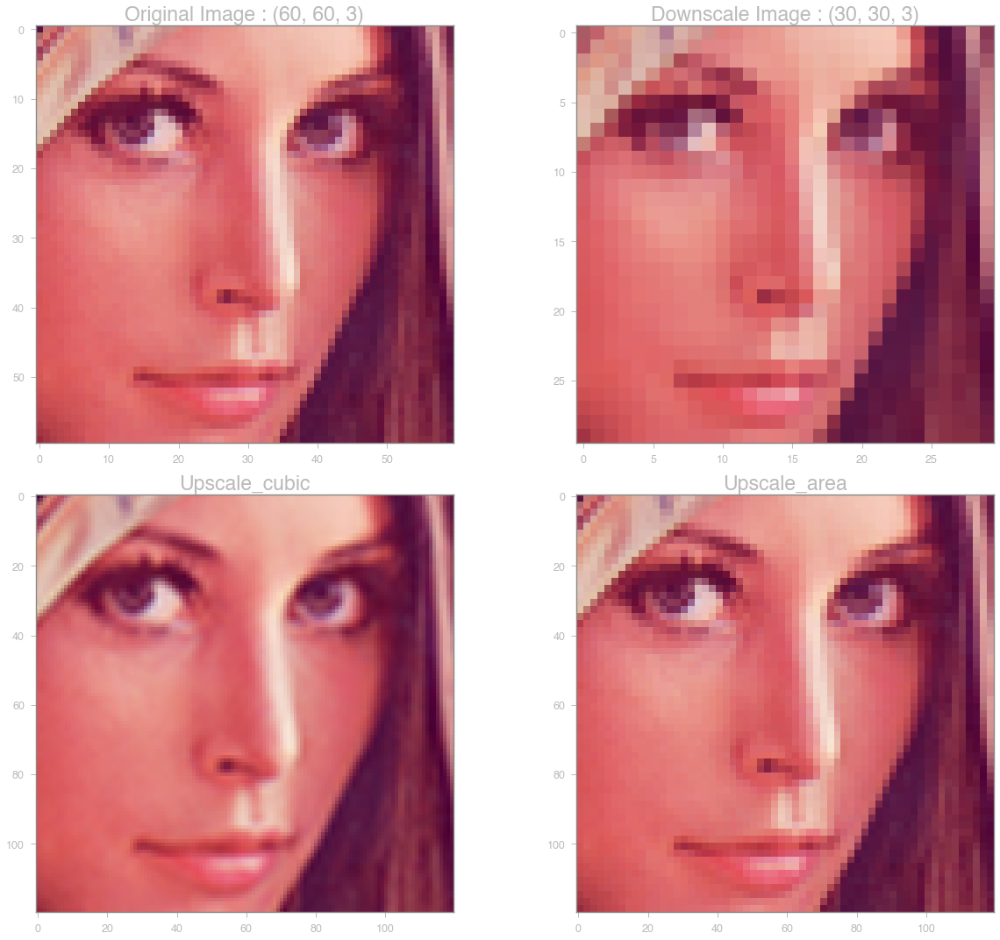

In [63]:
#collapse-hide
# Resizing
img = mpimg.imread('lenna.png')
h, w, d = img.shape
dims = (w//2, h//2)
dims_ = (w*2, h*2)
downscale = cv2.resize(img, dims, interpolation=cv2.INTER_AREA)
upscale = cv2.resize(img, dims_, interpolation=cv2.INTER_CUBIC)
upscale_ = cv2.resize(img, dims_, interpolation=cv2.INTER_AREA)

img = img[100:160, 100:160]
downscale = downscale[50:80, 50:80]
upscale = upscale[200:320, 200:320]
upscale_ = upscale_[200:320, 200:320]

imShow([img, downscale, upscale, upscale_], [f'Original Image : {img.shape}', f'Downscale Image : {downscale.shape}', f'Upscale_cubic', f'Upscale_area'])

# Image Enhancing

Sometime, we get the image that is *too dark* or *too bright*, that it lose the information for the image.

For that, we could use **transform** in gray scale to *hightlight* the place in the image that we interest in.

The basic methods for that would be :
   1. Negative
   2. Log Transform
   3. Gamma Transform
   4. Contrast Stretching (Normalization)
   5. Histogram Equalization
    
Here, we will focus on the first three method.

> Note: Here, We show with just gray scale, But you can always try with all 3 Color spaces and stack them later with **np.dstack((r, g, b))** if it is the color image.

### Negative
**Effect** :
Bright region turn to dark and dark region turn to bright.(invert of image).

**Equation** :
    $$y = 255-x$$
    
### Log Transform
**Effect** : 
Add brightness to where the image is dark.

**Equation** :
    $$y = log(c+x)$$
    where :
    $c$ = constance,
    $x$ = Normalized pixel

**Code** :
```python
# Normalized Image
x = x/255
y = np.log(c + x)
```

### Gamma Transform
**Effect** :
Adjustable change in brightness with gamma value.

**Equation** :
    $$y = x**r$$
    where :
   $r$ = gamma

**Code** : 
```python
# Normalized Image
x = x/255
y = x**r
```

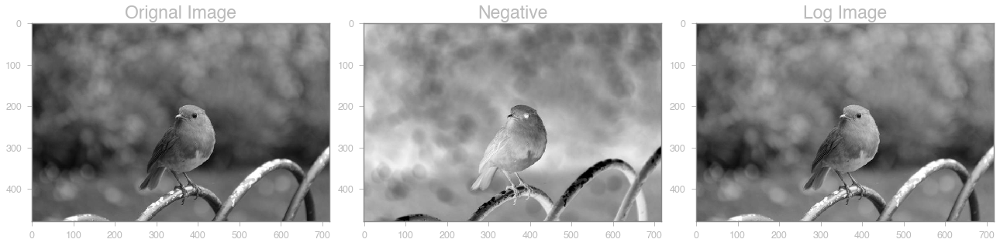

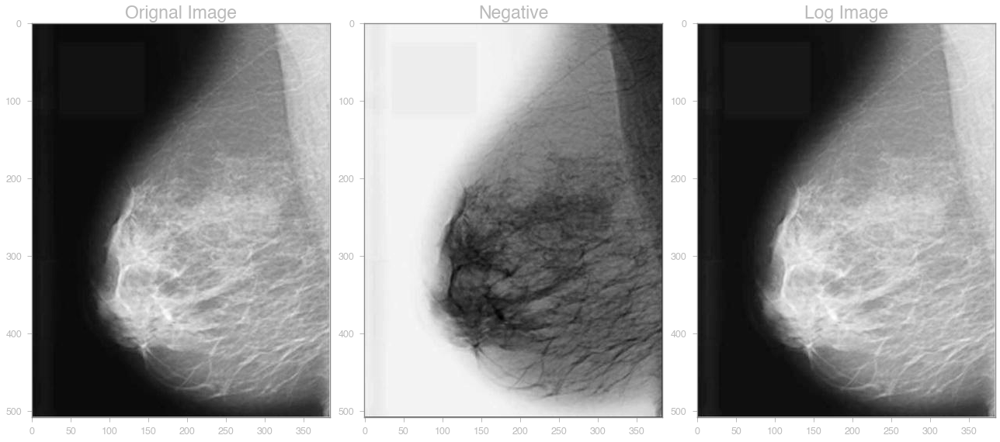

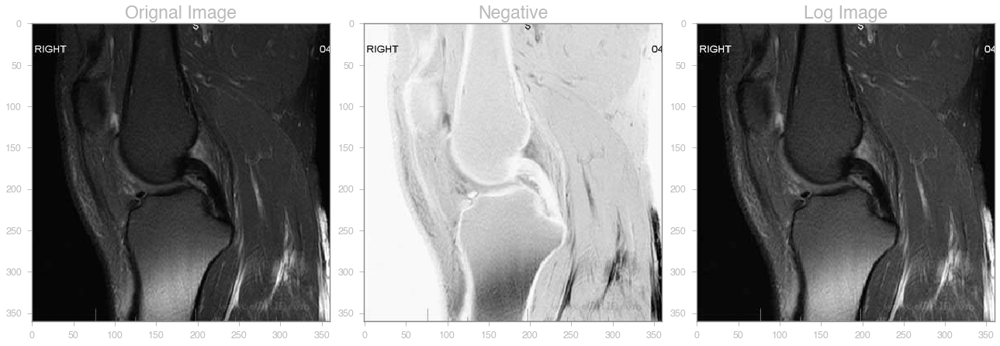

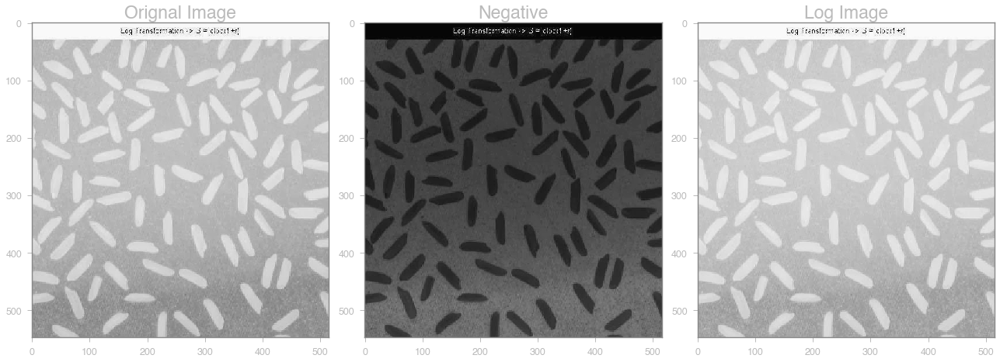

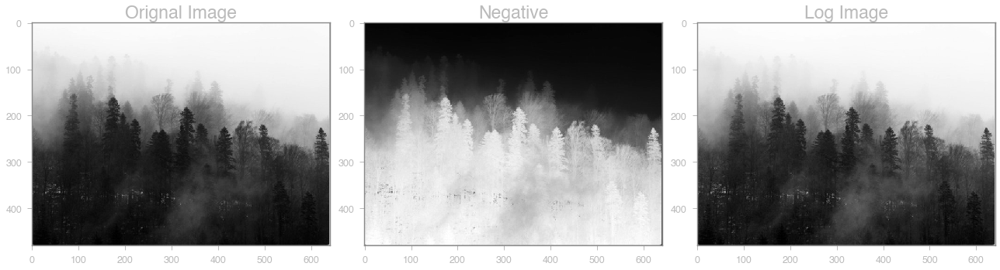

In [69]:
#collapse-hide
img_names = ['bird.jpg', 'F3.jpg', 'PCL.jpg', 'cells.jpg', 'tree.jpg']

for img_name in img_names:
    img = mpimg.imread(img_name)
    if img.ndim>=3:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    negative = 255-img
    img_copy = np.copy(img).astype(np.float32)
    img_copy /= 255
    log = np.log(1.0+img_copy)
    

#     imShow([img, negative, log], ['Orignal Image', 'Negative Image', 'Log Image'])
    imShow([img, negative, log], ['Orignal Image', 'Negative', 'Log Image'])

And Gamma correction with difference gamma value :

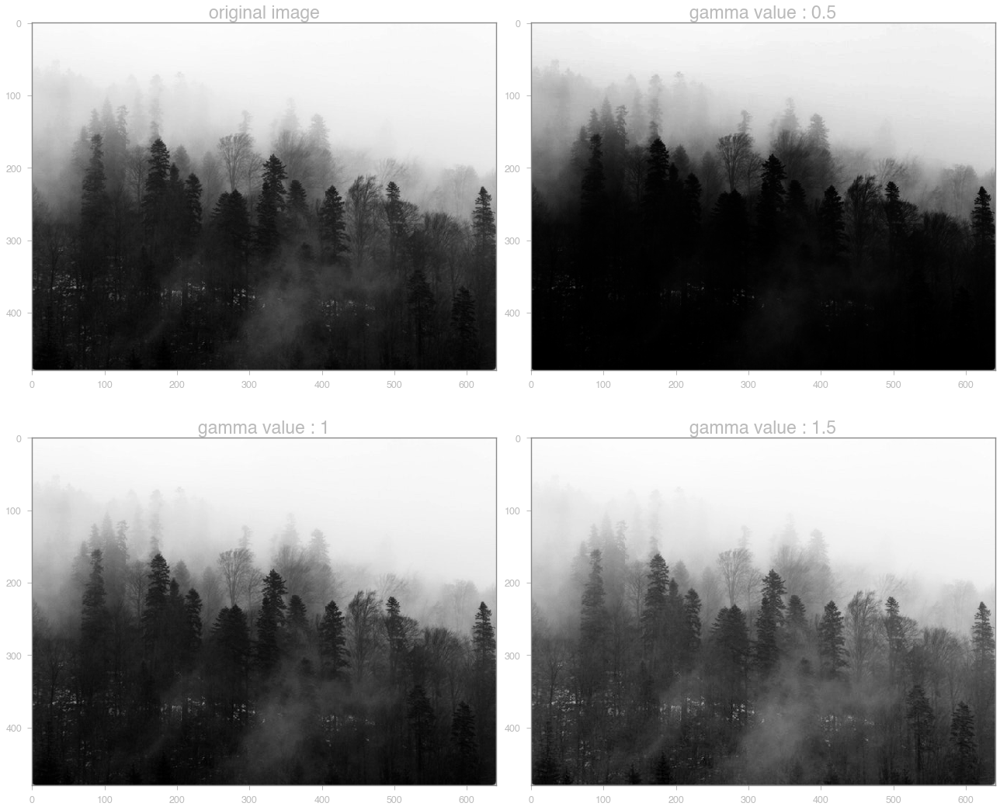

In [70]:
#collapse-hide
gamma0 = 0.5
gamma1 = 1
gamma2 = 1.5

img = mpimg.imread('tree.jpg')
if img.ndim>=3:
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    
r0 = 1/gamma0
result0 = (img/255)**r0
r1 = 1/gamma1
result1 = (img/255)**r1
r2 = 1/gamma2
result2 = (img/255)**r2

imShow([img, result0, result1, result2], 
       ['original image', f'gamma value : {gamma0}', 
       f'gamma value : {gamma1}', f'gamma value : {gamma2}'])

As Gamma value increase, the image get brighter.

# Image Gradient

## Edge Detection

Edge detection is the process of finding the boundaries (shape) of objects in the image. It works by detecting the change in pixel value in the image.

There are many ways to find the edge in the image. Mainly difference in the filter. Here, we will introduce two mostly used filter.

  1. Sobel Filter (L1)
```python
sobel = cv2.Sobel(img, filter_size, dx, dy)
```
  2. Laplacian Filter (L2)
```python
laplace = cv2.Laplacian(img, cv2.CV_64F, ksize)
```

After finding the edge, we could also use that to sharpen(enhance the edge) the image.
So, we could **Smooth (Blur)** the image and **sharp** the image.

Smoothing (Blurring) Image

Commanly used method:
 1. Gaussian Filter
 ```python
blurred = cv2.GaussianBlur(img, filter_size(tuple), std)
 ```
 2. Median Filter (Used to filter salt noise)
 ```python
blurred = cv2.medianBlur(img, filter_size(int))
 ```
 
 Belowing show the Difference in Edge detection Method.

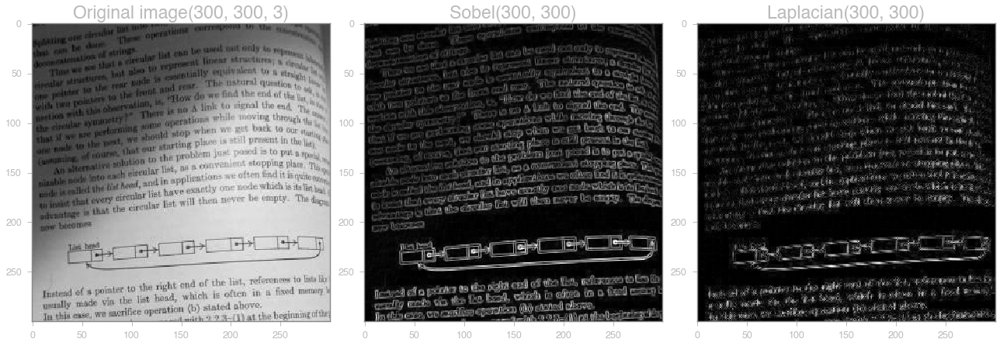

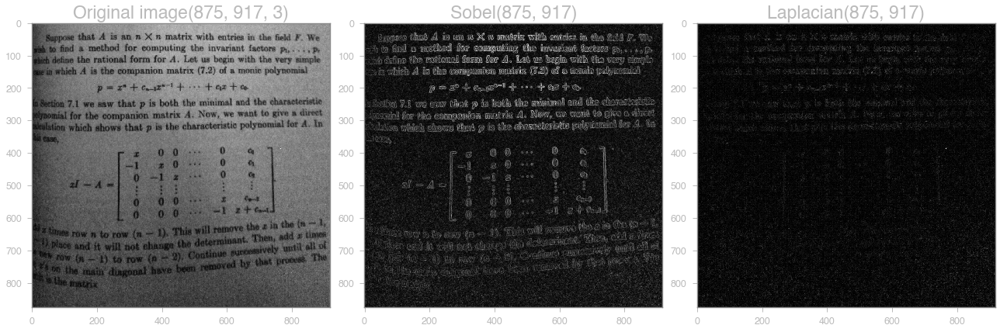

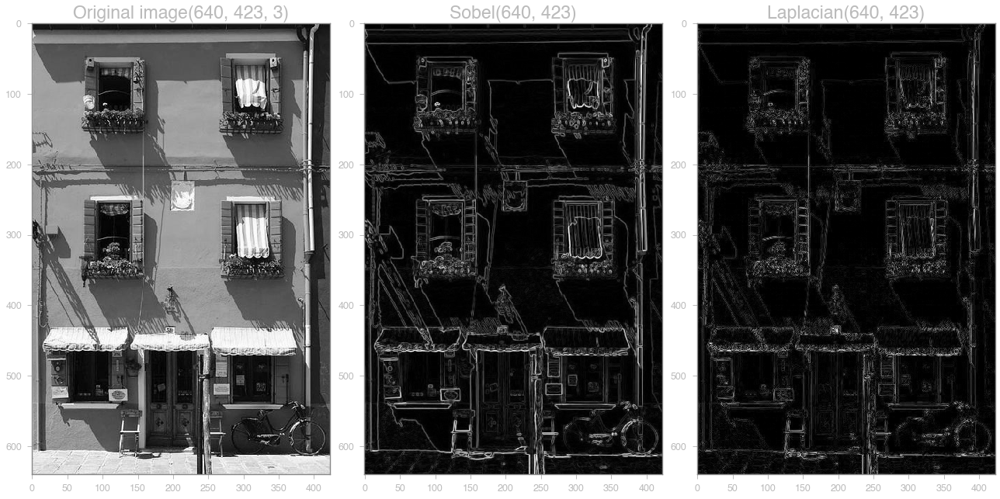

In [71]:
#collapse-hide
def sobelEdge(img):
    sobelx = np.abs(cv2.Sobel(img, 3, 0, 1)).astype(np.uint32)
    sobely = np.abs(cv2.Sobel(img, 3,1, 0)).astype(np.uint32)
    sobel = np.sqrt(np.square(sobelx) + np.square(sobely))
    sobel = (sobel/np.max(sobel)) * 255
    return sobel.astype(np.uint8)

def laplaceEdge(img):
    laplace = np.abs(cv2.Laplacian(img, cv2.CV_64F, ksize=3))
    laplace = ((laplace/np.max(laplace)) * 255).astype(np.uint8)
    return laplace
    
img_names = ['dark.jpg', 'page.jpg','tower.jpg']
for img_name in img_names:
    img = mpimg.imread(img_name)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    sobel = sobelEdge(gray)
    laplace = laplaceEdge(gray)
    imShow([gray, sobel, laplace], [f'Original image{img.shape}', f'Sobel{sobel.shape}', f'Laplacian{laplace.shape}'])

And the result of **Smoothing** and **Sharpening** of images.

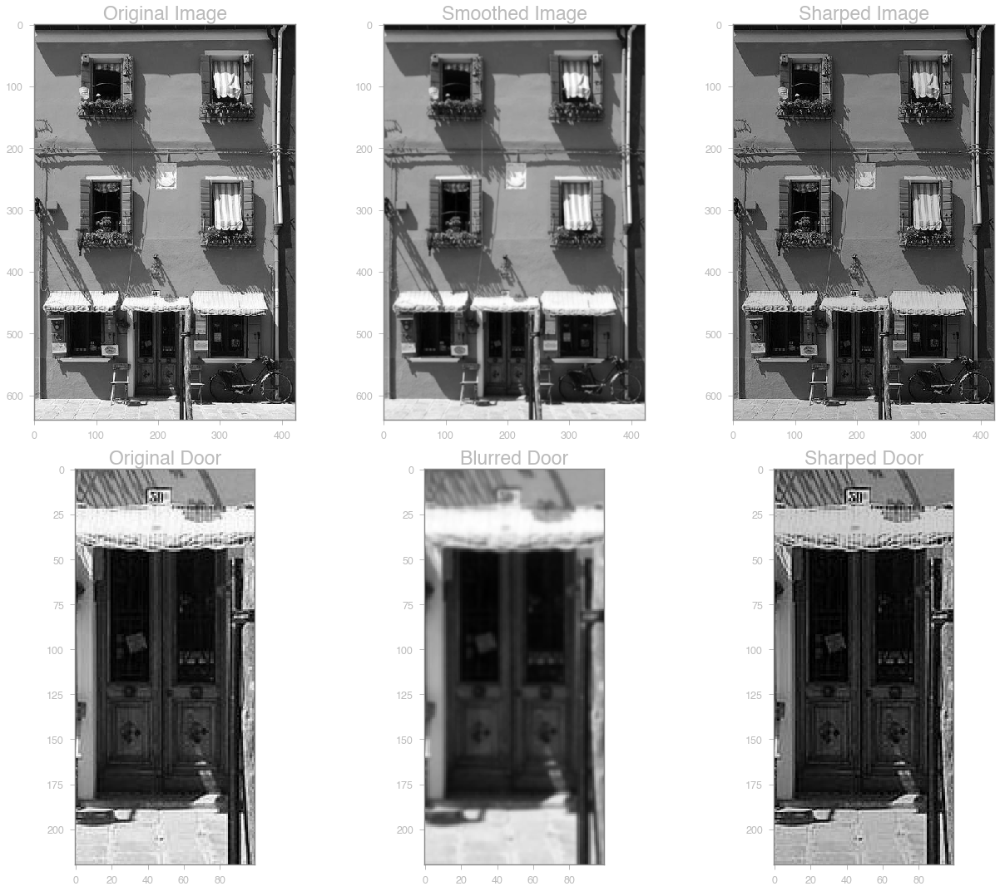

In [72]:
#collapse-hide
def smooth(img):
    blurred = cv2.GaussianBlur(img, (9,9), 1)
    return blurred

def sharp(img):
    blurred = cv2.GaussianBlur(img, (5, 5), 1).astype(np.float32)
    img = img.astype(np.float32)
    result = np.abs((1.5*img) - (0.5*blurred))
    result = ((result/np.max(result)) * 255).astype(np.uint8)
    return result

blurred = smooth(gray)
sharped = sharp(gray)
door = gray[420:, 150:250]
door_blurred = blurred[420:, 150:250]
door_sharped = sharped[420:, 150:250]

imShow([gray, blurred, sharped, door, door_blurred, door_sharped],
       ['Original Image', 'Smoothed Image', 'Sharped Image', "Original Door",
       'Blurred Door', 'Sharped Door'])

# Image Segmentation

The image show in `plt.imshow()` typically take three types of range.
 - uint8, range from (0~255)[total of 256 level]
 - float64, range from (0~1)[total of many floating level]<eg. 0.1, 0.11, 0.111>
 - Binary Image, contain only (0 and 1)[2 level]<0 mean dark and 1 mean light>
 
Usually, we use binary image in *Mask*.
>1 mean object and 0 mean background.

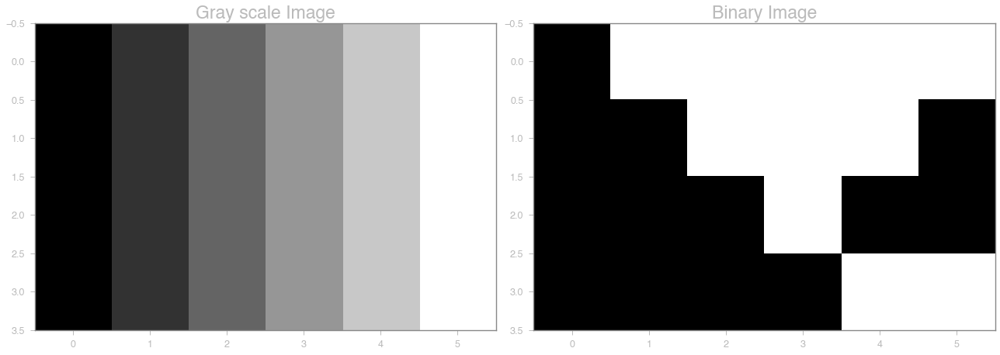

In [73]:
#collapse-hide
# Gray Scale Image
img1 = np.array([[0, 50, 100, 150, 200, 255],
                [0, 50, 100, 150, 200, 255],
                [0, 50, 100, 150, 200, 255],
                [0, 50, 100, 150, 200, 255]])
# Binary Image
img2 = np.array([[0, 1, 1, 1, 1, 1],
                [0, 0, 1, 1, 1, 0],
                [0, 0, 0, 1, 0, 0],
                [0, 0, 0, 0, 1, 1]])

imShow([img1, img2], ['Gray scale Image', 'Binary Image'])

For the thresholding, two methods can be used.
 1. Global Thresholding (one threshold value for all region in the image)

Typically, we set the threshold value to `random number`, or we find the best threshold value by `trial and error`. Or we can use `**otsu**` method, which find the optimized threshold value from intensity histogram of image.

 2. Adaptive Thresholding
 
Since the lighting condition in different region in a single image can be different, Adaptive thresholding method is often better than global method.

Adaptive threshold use difference threshold value in different region.

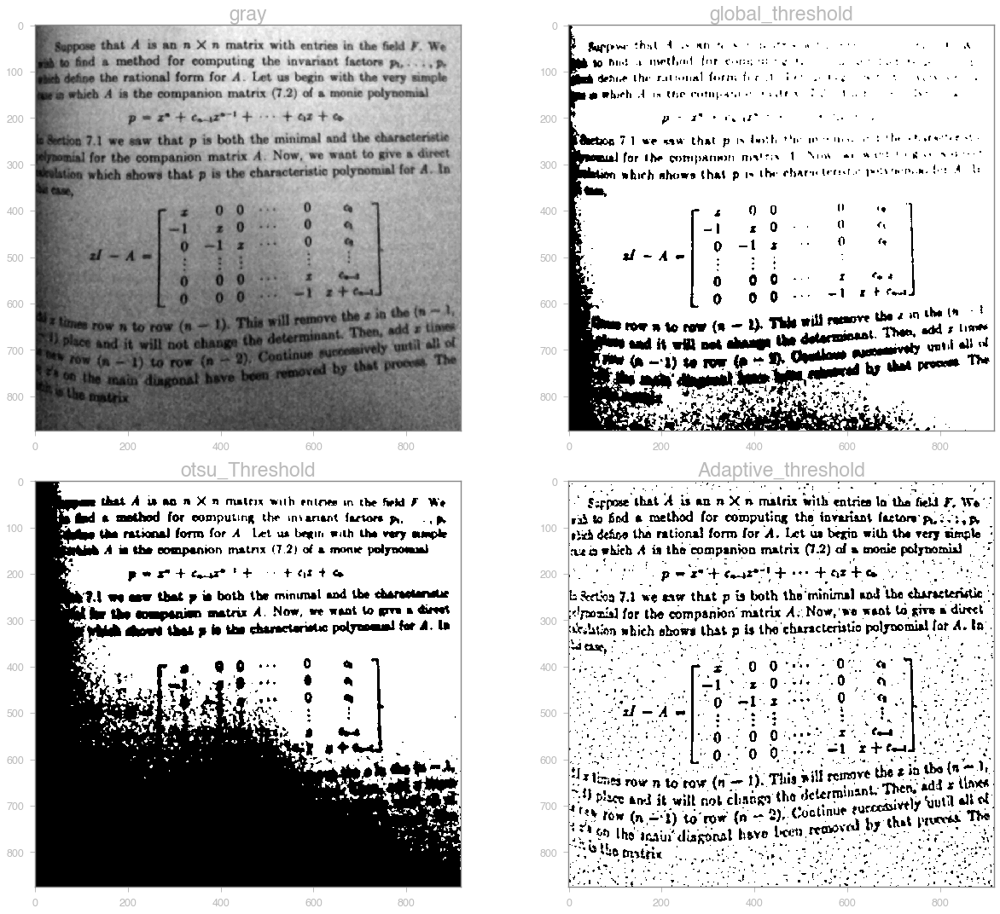

In [74]:
#collapse-hide
# Global Threshold
img = mpimg.imread('page.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)  # 0 ~ 255
gray = cv2.medianBlur(gray, 5)
glob_thresh = np.ones_like(gray)
glob_thresh[gray<25] = 0  # 0 & 1

adap_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                   cv2.THRESH_BINARY, 15, 3)

_, otsu_thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

imShow([gray, glob_thresh, otsu_thresh, adap_thresh],
       ['gray', 'global_threshold', 'otsu_Threshold', 'Adaptive_threshold'])

Since thresholding process is transforming gray scale image to **Binary one**, it is also called `binarization`.
> Different method for thresholding would be useful in different scenerios.<br>The best way to find the best method is by trial and error.

For example, althought gobal thresholding method may not give better result than adaptive one, but its speed is faster casue there is not need to find the threshold value, by assigned by the user.

# [Morphological Transformations](https://docs.opencv.org/master/d9/d61/tutorial_py_morphological_ops.html)

Morphological transform is the transformation of shape in the binarization image. Typically used to modify the **Mask (Binary Image)**.

Mostly Used methods are called:
 1. Erosion (Reduce Shape)
 2. Dilation (Expand Shape)

And the combination of these methods evolved to:
 1. Opening (Disconnect closely related part)
 2. Closing (Connect closely related Part)

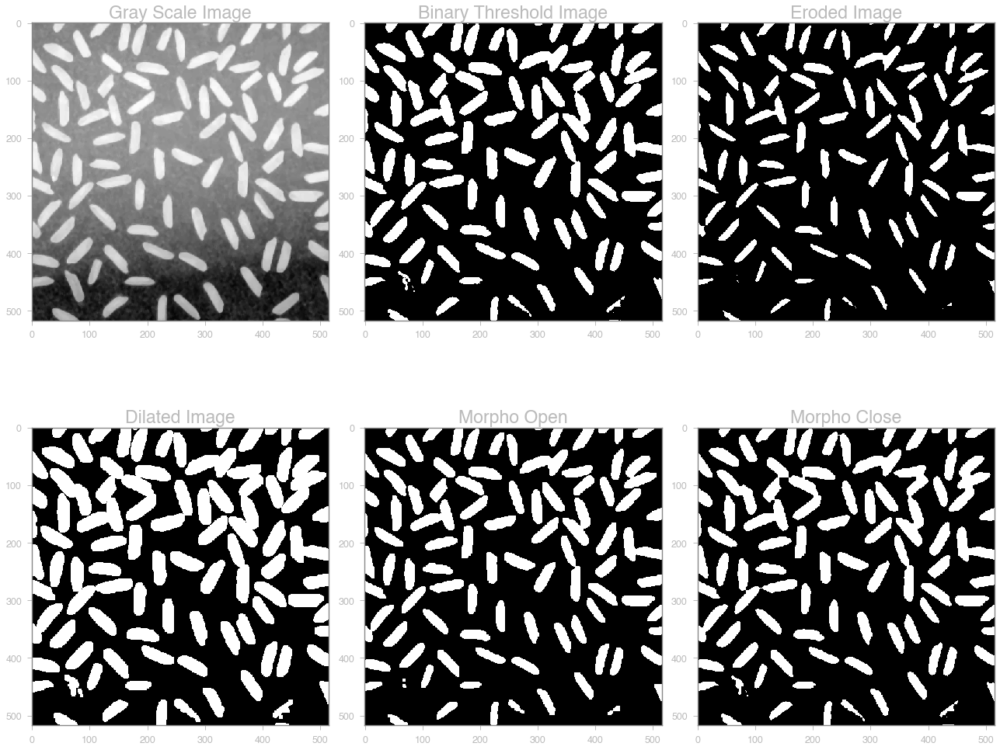

In [75]:
#collapse-hide
img = mpimg.imread('cells.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
gray = cv2.medianBlur(gray, 5)
gray = gray[30:, :]

# Let's do some thresholding
thresh = np.zeros_like(gray)
# threshold value here get by trial and error
thresh[gray>175] = 1


kernel = np.ones((5,5), np.uint8)
#Erosion
eroded = cv2.erode(thresh, kernel, iterations=1)
#Dilation
dilated = cv2.dilate(thresh, kernel, iterations=1)

# Opening (Erosion + Dilation)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
# Closing (Dilation + Erosion)
closing = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
imShow([gray, thresh, eroded, dilated, opening, closing],
       ['Gray Scale Image', 'Binary Threshold Image', 'Eroded Image',
        'Dilated Image', 'Morpho Open', 'Morpho Close'])

In Opening, the method `open(separate)` the closely connected part.
Opening is achieved by first *erosion*, then *dilation*.

In Closing, the method `close(connect)` the closely connected part.
Closing is achieved by first *dilation*, then *erosion*.

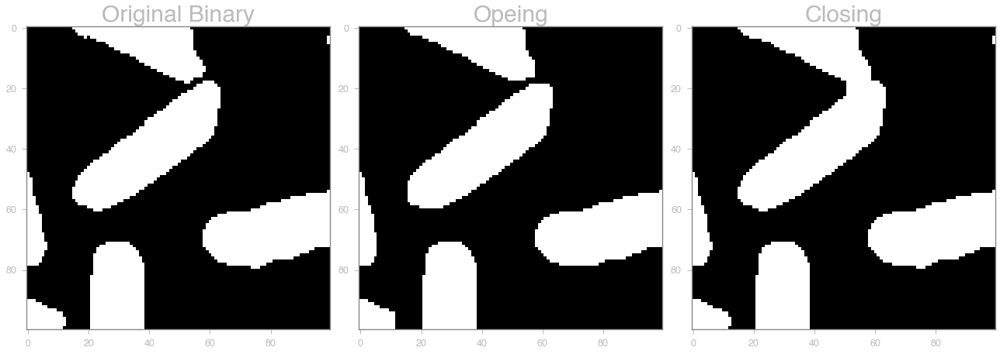

In [3]:
#collapse-hide
thresh_ = thresh[100:200, 150:250]
open_ = opening[100:200, 150:250]
close_ = closing[100:200, 150:250]
imShow([thresh_, open_, close_],
       ['Original Binary', 'Opeing', 'Closing'])

# Conclusion

The Above mentioned methods are all just basic image processing techniques. There are certainly many more state of the art algorithms.

But, If we get the idea that image are numbers and various functions could be apply to the image, then, we could modify and create intereting projects in computer vision.